In [1]:
import os
os.getcwd()

'C:\\Users\\Admin\\Documents\\Model\\mUnet'

In [2]:
import os
from PIL import Image
from collections import Counter

# Define the folder paths
path = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256'
source_ori = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\prep_ori'
source_gt = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\prep_gt'

def analyze_images(folder_path):
    total_images = 0
    total_size = [0, 0]  # Width, Height
    total_pixels = 0
    color_modes = []
    file_formats = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            total_images += 1
            img_path = os.path.join(folder_path, filename)
            with Image.open(img_path) as img:
                width, height = img.size
                total_size[0] += width
                total_size[1] += height
                total_pixels += width * height
                color_modes.append(img.mode)
                file_formats.append(img.format)

    # Calculate average size
    if total_images > 0:
        avg_size = (total_size[0] // total_images, total_size[1] // total_images)
        avg_total_pixels = total_pixels / total_images
        most_common_color_mode = Counter(color_modes).most_common(1)[0][0]
        most_common_format = Counter(file_formats).most_common(1)[0][0]
    else:
        avg_size = (0, 0)
        avg_total_pixels = 0
        most_common_color_mode = None
        most_common_format = None

    return {
        "Total Gambar": total_images,
        "Rata-rata Ukuran Gambar": avg_size,
        "Rata-rata Total Piksel": avg_total_pixels,
        "Mode Warna Paling Sering": most_common_color_mode,
        "Format File": most_common_format
    }

# Analyze both folders
results = {
    "Original": analyze_images(source_ori),
    "Ground Truth": analyze_images(source_gt)
}

# Display results
for folder_name, info in results.items():
    print(f"Hasil Analisis untuk Folder {folder_name}:")
    print(f"Total Gambar: {info['Total Gambar']}")
    print(f"Rata-rata Ukuran Gambar: ({info['Rata-rata Ukuran Gambar'][0]:.2f} x {info['Rata-rata Ukuran Gambar'][1]:.2f})")
    print(f"Rata-rata Total Piksel: {info['Rata-rata Total Piksel']:.2f}")
    print(f"Mode Warna Paling Sering: {info['Mode Warna Paling Sering']}")
    print(f"Format File: {info['Format File']}\n")

# Ensure that the number of images in the Original and Ground Truth folders is the same
assert results["Original"]["Total Gambar"] == results["Ground Truth"]["Total Gambar"], "Jumlah gambar di folder ORI dan GT tidak sama"

# Ensure that the average image size in both folders is the same
assert results["Original"]["Rata-rata Ukuran Gambar"] == results["Ground Truth"]["Rata-rata Ukuran Gambar"], "Rata-rata ukuran gambar di folder ORI dan GT tidak sama"

# Ensure that the average total pixels in both folders are the same
assert results["Original"]["Rata-rata Total Piksel"] == results["Ground Truth"]["Rata-rata Total Piksel"], "Rata-rata total piksel di folder ORI dan GT tidak sama"

# Ensure that the most common color mode in both folders is the same
assert results["Original"]["Mode Warna Paling Sering"] == results["Ground Truth"]["Mode Warna Paling Sering"], "Mode warna paling sering di folder ORI dan GT tidak sama"

# Ensure that the file formats in both folders are the same
assert results["Original"]["Format File"] == results["Ground Truth"]["Format File"], "Format file di folder ORI dan GT tidak sama"

print("\nSemua pengujian berhasil! Folder original dan ground_truth memiliki data gambar yang sama.")

Hasil Analisis untuk Folder Original:
Total Gambar: 112
Rata-rata Ukuran Gambar: (256.00 x 256.00)
Rata-rata Total Piksel: 65536.00
Mode Warna Paling Sering: RGB
Format File: PNG

Hasil Analisis untuk Folder Ground Truth:
Total Gambar: 112
Rata-rata Ukuran Gambar: (256.00 x 256.00)
Rata-rata Total Piksel: 65536.00
Mode Warna Paling Sering: RGB
Format File: PNG


Semua pengujian berhasil! Folder original dan ground_truth memiliki data gambar yang sama.


# Split Data

In [3]:
from sklearn.model_selection import train_test_split
import shutil

# Folder tujuan untuk train, validation, dan test di bawah base
train_dir = path + '\\split\\original\\train'
val_dir = path + '\\split\\original\\val'
test_dir = path + '\\split\\original\\test'

# Membuat folder untuk train, validation, dan test
os.makedirs(os.path.join(train_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'ground_truth'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'ground_truth'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'ground_truth'), exist_ok=True)


# Mendapatkan semua file gambar dan mask
original_files = sorted(os.listdir(source_ori))
ground_truth_files = sorted(os.listdir(source_gt))

# Pengecekan apakah jumlah file gambar dan mask sama
if len(original_files) != len(ground_truth_files):
    print(f"WARNING: Jumlah gambar asli ({len(original_files)}) tidak sama dengan jumlah mask ({len(ground_truth_files)})")
else:
    print(f"Jumlah gambar dan mask sesuai: {len(original_files)} file")

# Rasio pembagian dataset
train_ratio = 0.8  # 80% untuk train
val_ratio = 0.1    # 10% untuk validation
test_ratio = 0.1   # 10% untuk test

# Pastikan rasio totalnya 1.0
if (train_ratio + val_ratio + test_ratio) != 1.0:
    raise ValueError("Rasio train, validation, dan test harus berjumlah 1.0")

# Membagi dataset menjadi train, val, test
train_original, temp_original, train_ground_truth, temp_ground_truth = train_test_split(
    original_files, ground_truth_files, test_size=(1.0 - train_ratio), random_state=42)

val_size = val_ratio / (val_ratio + test_ratio)  # Menghitung rasio validasi terhadap (validasi + test)

val_original, test_original, val_ground_truth, test_ground_truth = train_test_split(
    temp_original, temp_ground_truth, test_size=(1.0 - val_size), random_state=42)

# Fungsi untuk menyalin file ke direktori yang tepat
def copy_files(original_list, ground_truth_list, folder):
    if not original_list or not ground_truth_list:
        print(f"ERROR: Tidak ada file untuk diproses di {folder}")
        return

    for orig, gt in zip(original_list, ground_truth_list):
        shutil.copy(os.path.join(source_ori, orig), os.path.join(folder, 'original', orig))
        shutil.copy(os.path.join(source_gt, gt), os.path.join(folder, 'ground_truth', gt))

    print(f"{len(original_list)} file berhasil disalin ke {folder}")

# Menyalin file ke folder masing-masing
copy_files(train_original, train_ground_truth, train_dir)
copy_files(val_original, val_ground_truth, val_dir)
copy_files(test_original, test_ground_truth, test_dir)

Jumlah gambar dan mask sesuai: 112 file
89 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\train
11 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\val
12 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\test


# One Hot Encoding

Train Shapes:
X_train: (89, 256, 256, 3)
y_train: (89, 256, 256, 3)

Validation Shapes:
X_val: (11, 256, 256, 3)
y_val: (11, 256, 256, 3)

Class Information and Hex Color Codes:
Class 0: #ff0000
Class 2: #00ff00
Class 1: #0000ff
Unique classes in one_hot_visual: [0 1 2]


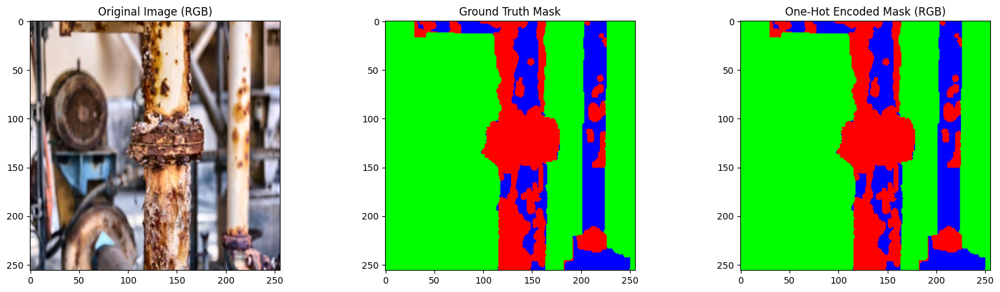

Unique classes in one_hot_visual: [1 2]


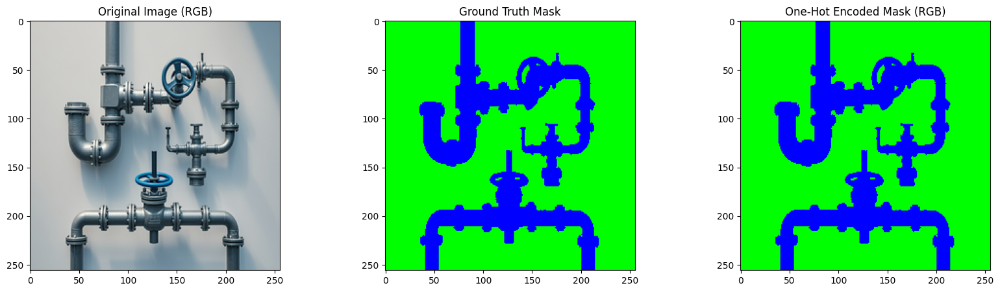

In [4]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Convert RGB to HEX color codes
def rgb_to_hex(rgb):
    """Convert RGB to HEX color code."""
    return "#{:02x}{:02x}{:02x}".format(rgb[0], rgb[1], rgb[2])

# Encode the mask image into class indices
def encode_mask(mask_image, tolerance=3):
    """Encode the mask based on RGB values into class labels."""
    # Replace black background with green (assuming black is not a valid class)
    mask_image[np.all(mask_image == [0, 0, 0], axis=-1)] = [0, 255, 0]

    # Initialize encoded mask
    encoded_mask = np.zeros((mask_image.shape[0], mask_image.shape[1]), dtype=np.uint8)

    # Define class masks based on RGB color values with tolerance
    red_mask = np.all(np.abs(mask_image - [255, 0, 0]) <= tolerance, axis=-1)
    encoded_mask[red_mask] = 0

    green_mask = np.all(np.abs(mask_image - [0, 255, 0]) <= tolerance, axis=-1)
    encoded_mask[green_mask] = 2

    blue_mask = np.all(np.abs(mask_image - [0, 0, 255]) <= tolerance, axis=-1)
    encoded_mask[blue_mask] = 1

    return encoded_mask

# One-hot encode the encoded mask
def one_hot_encode(encoded_mask, num_classes=3):
    """Convert the encoded mask into a one-hot encoded mask."""
    one_hot_mask = np.eye(num_classes)[encoded_mask]
    return one_hot_mask

# Load images and masks, then apply encoding and resizing
def load_and_one_hot_encode(original_dir, mask_dir, target_size=None):
    """Load images and masks, resize them, and apply one-hot encoding."""
    images = []
    masks = []
    one_hot_masks = []

    image_files = sorted(os.listdir(original_dir))
    mask_files = sorted(os.listdir(mask_dir))

    for img_file, mask_file in zip(image_files, mask_files):
        # Read images and convert to RGB
        img = cv2.cvtColor(cv2.imread(os.path.join(original_dir, img_file)), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(os.path.join(mask_dir, mask_file)), cv2.COLOR_BGR2RGB)

        # Resize if target_size is specified
        if target_size is not None:
            img = cv2.resize(img, target_size)
            mask = cv2.resize(mask, target_size)

        # Ensure the image and mask have the same dimensions
        if img.shape[:2] == mask.shape[:2]:
            images.append(img)
            masks.append(mask)

            # Encode the mask and apply one-hot encoding
            encoded_mask = encode_mask(mask)
            one_hot_mask = one_hot_encode(encoded_mask)
            one_hot_masks.append(one_hot_mask)
        else:
            print(f"Size mismatch for {img_file} ({img.shape}) and {mask_file} ({mask.shape}). Skipping...")

    images = np.array(images)
    masks = np.array(masks)
    one_hot_masks = np.array(one_hot_masks)

    return images, masks, one_hot_masks

# Convert one-hot encoded mask to an RGB image for visualization
def convert_to_rgb(one_hot_visual, colormap):
    """Convert one-hot encoded mask to an RGB image for visualization."""
    shape = one_hot_visual.shape
    rgb_image = np.zeros((shape[0], shape[1], 3), dtype=np.uint8)

    # Map each class index to its corresponding color
    for class_index, color in colormap.items():
        rgb_image[one_hot_visual == class_index] = color

    return rgb_image

# Visualize original image, ground truth mask, one-hot mask, and the RGB-encoded mask
def visualize_sample(image, mask, one_hot_mask, colormap):
    """Visualize the original image, mask, one-hot encoded mask, and RGB encoded mask."""
    plt.figure(figsize=(20, 5))

    one_hot_visual = np.argmax(one_hot_mask, axis=-1)

    # Debugging output to check the unique classes
    print("Unique classes in one_hot_visual:", np.unique(one_hot_visual))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image (RGB)')

    plt.subplot(1, 3, 2)
    plt.imshow(mask)
    plt.title('Ground Truth Mask')

    plt.subplot(1, 3, 3)
    rgb_encoded_mask = convert_to_rgb(one_hot_visual, colormap)
    plt.imshow(rgb_encoded_mask)
    plt.title('One-Hot Encoded Mask (RGB)')
    plt.show()

# Define directories for training, validation, and test data
base_split = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\split\\original'
train_original_dir = os.path.join(base_split, "train", "original")
train_mask_dir = os.path.join(base_split, "train", "ground_truth")
val_original_dir = os.path.join(base_split, "val", "original")
val_mask_dir = os.path.join(base_split, "val", "ground_truth")
test_original_dir = os.path.join(base_split, "test", "original")
test_mask_dir = os.path.join(base_split, "test", "ground_truth")

target_size = (256, 256)

# Load and one-hot encode training and validation sets
train_images, train_masks, train_one_hot_masks = load_and_one_hot_encode(train_original_dir, train_mask_dir, target_size)
val_images, val_masks, val_one_hot_masks = load_and_one_hot_encode(val_original_dir, val_mask_dir, target_size)

# Assign data to training and validation sets
X_train = train_images
y_train = train_one_hot_masks

X_val = val_images
y_val = val_one_hot_masks

# Test set (loading only the paths, loading the images should be done similarly as train/val if needed)
X_test = test_original_dir
y_test = test_mask_dir

# Print shapes of the datasets for verification
print("Train Shapes:")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

print("\nValidation Shapes:")
print("X_val:", X_val.shape)
print("y_val:", y_val.shape)

# Define colormap for each class index
colormap = {
    0: [255, 0, 0],    # Red
    2: [0, 255, 0],    # Green
    1: [0, 0, 255],    # Blue
}
# Print class information and hex color codes
print("\nClass Information and Hex Color Codes:")
for class_index, color in colormap.items():
    hex_color = rgb_to_hex(color)
    print(f'Class {class_index}: {hex_color}')

# Visualize a sample from the training set
index = 2  # Change this to visualize other samples
visualize_sample(X_train[index], train_masks[index], y_train[index], colormap)

# Visualize a sample from the validation set
index_val = 10  # Change this to visualize other samples
visualize_sample(X_val[index_val], val_masks[index_val], y_val[index_val], colormap)

# Model Arsitektur

In [5]:
# Mobile U-Net + EfficientNetB1

import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.layers import Input, SeparableConv2D, Conv2DTranspose, BatchNormalization
from tensorflow.keras.layers import Activation, Concatenate, Dropout
from tensorflow.keras.models import Model

def conv_block(inputs, num_filters, kernel_size=3, padding='same'):
    """
    Lightweight convolution block using SeparableConv2D.
    """
    x = SeparableConv2D(num_filters, kernel_size, padding=padding)(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def deconv_block(inputs, skip_features, num_filters):
    """
    Lightweight decoder block with reduced number of filters.
    """
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding='same')(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_light_mobile_unet(input_shape=(256, 256, 3), num_classes=3):
    """
    Lightweight Mobile UNet architecture.
    """
    # Input
    inputs = Input(shape=input_shape)
    
    # Load pre-trained EfficientNetB1 as encoder
    encoder = EfficientNetB1(
        include_top=False,
        weights='imagenet',
        input_tensor=inputs
    )
    
    # Get skip connections from encoder
    s1 = encoder.get_layer('block2a_expand_activation').output    # 128x128
    s2 = encoder.get_layer('block3a_expand_activation').output    # 64x64
    s3 = encoder.get_layer('block4a_expand_activation').output    # 32x32
    s4 = encoder.get_layer('block6a_expand_activation').output    # 16x16
    
    # Bridge
    b1 = encoder.output  # 8x8
    
    # Decoder (with reduced filters)
    d1 = deconv_block(b1, s4, 128)        # 16x16
    d2 = deconv_block(d1, s3, 64)         # 32x32
    d3 = deconv_block(d2, s2, 32)         # 64x64
    d4 = deconv_block(d3, s1, 16)         # 128x128
    
    # Upsampling to original size
    d5 = Conv2DTranspose(16, (2, 2), strides=2, padding='same')(d4)  # 256x256
    d5 = conv_block(d5, 16)
    d5 = Dropout(0.2)(d5)
    
    # Output layer
    outputs = SeparableConv2D(num_classes, (1, 1), padding='same', activation='softmax')(d5)
    
    # Create model
    model = Model(inputs=inputs, outputs=outputs, name='Mobile_U-Net_EfficientNetB1_256')
    
    return model

# Create and compile the lighter model
model = build_light_mobile_unet(input_shape=(256, 256, 3), num_classes=3)

# Print model summary
model.summary()

Model: "Mobile_U-Net_EfficientNetB1_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling (Rescaling)         │ (None, 256, 256, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ normalization (Normalization) │ (None, 256, 256, 3)       │               7 │ rescaling[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling_1 (Rescaling)       │ (None, 256, 256, 3)       │               0 │ normalization[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv_pad (ZeroPadding2D) │ (None, 257, 257, 3)       │               0 │ rescaling_1[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 128, 128, 32)      │             864 │ stem_conv_pad[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 128, 128, 32)      │             128 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 128, 128, 32)      │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 128, 128, 32)      │             288 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 128, 128, 32)      │             128 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 128, 128, 32)      │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 32)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 32)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 8)           │             264 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 32)          │             288 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 7,418,442 (28.30 MB)

 Trainable params: 7,355,875 (28.06 MB)

 Non-trainable params: 62,567 (244.41 KB)

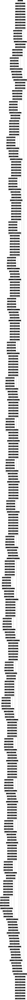

In [6]:
# Menampilkan Visual Arsitektur Model
from tensorflow.keras.utils import plot_model

# Path ke folder output untuk hasil augmentasi images dan ground truth
architecture = 'C:\\Users\\Admin\\Documents\\Model\Architecture'
os.makedirs(architecture, exist_ok=True)

# Misalnya, model adalah nama variabel yang berisi arsitektur model Keras
plot_model(model, to_file='C:\\Users\\Admin\\Documents\\Model\\Architecture\\MobileU-Net_EfficientNetB1_256.png', show_shapes=True, show_layer_names=True)

# Train Model

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4729 - loss: 1.0802   
Epoch 1: saving model to .//model//256O_B8E100_MobileU-Net-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 78s 3s/step - accuracy: 0.4733 - loss: 1.0792 - val_accuracy: 0.5830 - val_loss: 1.0902 - learning_rate: 0.0010
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4971 - loss: 1.0192 
Epoch 2: saving model to .//model//256O_B8E100_MobileU-Net-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.4981 - loss: 1.0182 - val_accuracy: 0.6099 - val_loss: 1.0856 - learning_rate: 0.0010
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5762 - loss: 0.9298 
Epoch 3: saving model to .//model//256O_B8E100_MobileU-Net-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.5752 - loss: 0.9295 - val_accuracy: 0.6078 - val_loss: 1.0831 - learning_rate: 0.0010
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6374 - loss: 0.8328 
E

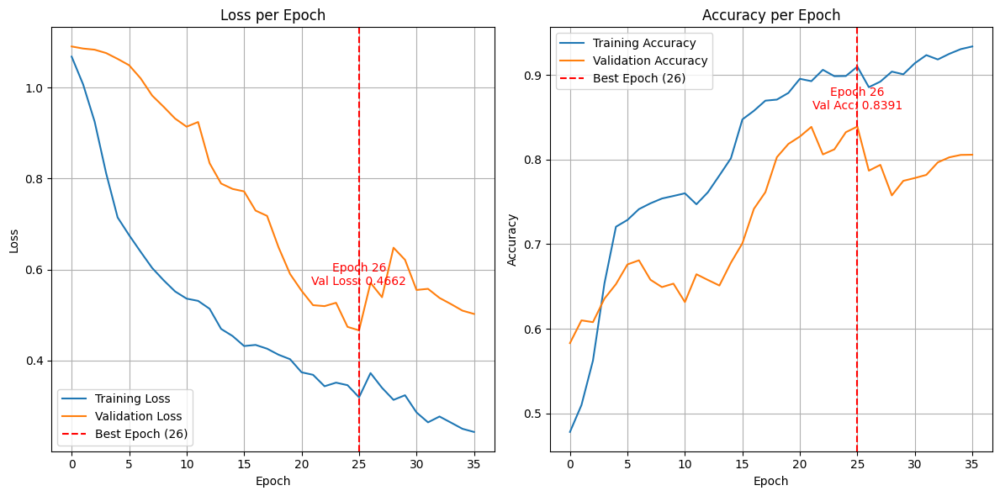

In [7]:
# Train Model
from tensorflow.keras.optimizers import Adam
import time
from datetime import datetime
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=False, verbose=1)

# Model Checkpoint
model_checkpoint = ModelCheckpoint( filepath='.//model//256O_B8E100_MobileU-Net-EfficientNetB1.keras', monitor='val_loss', mode='min', save_best_only=False, verbose=1)

# Reduce Learning Rate
reduce_lr = ReduceLROnPlateau( monitor='val_loss', factor=0.1, patience=5, mode='min', min_lr=1e-6, verbose=1)

# Buat direktori log untuk TensorBoard
log_dir = "logs/fit/O-B8E100/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True
)

# # Combine all callbacks
callbacks = [early_stopping, model_checkpoint, reduce_lr, tensorboard]

# Mengukur waktu komputasi saat pelatihan
start_time = time.time()

# Kompilasi model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Latih model dan simpan riwayat pelatihan
history = model.fit(X_train, y_train,
                    epochs=100,
                    batch_size=8,
                    validation_data=(X_val, y_val),
                    callbacks = callbacks)

end_time = time.time()
training_time = end_time - start_time

# Ukuran model dalam byte
model_size = model.count_params() * 4  # Menghitung ukuran model dalam byte (asumsi float32)

print(f'Waktu Komputasi untuk Pelatihan: {training_time:.2f} detik')
print(f'Ukur Model: {model_size / (1024 ** 2):.2f} MB')  # Mengonversi ke MB

# Visualisasi loss
# Menentukan epoch terbaik berdasarkan val_loss
best_epoch = history.history['val_loss'].index(min(history.history['val_loss']))
best_val_loss = history.history['val_loss'][best_epoch]

# Menentukan val_accuracy terbaik pada epoch terbaik
best_val_acc = history.history['val_accuracy'][best_epoch]

plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

# Menambahkan garis vertikal pada epoch terbaik
plt.axvline(x=best_epoch, color='red', linestyle='--', label=f'Best Epoch ({best_epoch+1})')

# Menambahkan teks di atas garis vertikal
plt.text(best_epoch, best_val_loss + 0.1,  # Posisi teks sedikit di atas titik
         f'Epoch {best_epoch+1}\nVal Loss: {best_val_loss:.4f}', 
         color='red', fontsize=10, ha='center')

plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Plot akurasi
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

# Menambahkan garis vertikal pada epoch terbaik
plt.axvline(x=best_epoch, color='red', linestyle='--', label=f'Best Epoch ({best_epoch+1})')

# Menambahkan teks di atas garis vertikal
best_val_acc = history.history['val_accuracy'][best_epoch]
plt.text(best_epoch, best_val_acc + 0.02,  # Posisi teks sedikit di atas titik
         f'Epoch {best_epoch+1}\nVal Acc: {best_val_acc:.4f}', 
         color='red', fontsize=10, ha='center')

plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

# Evaluasi Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


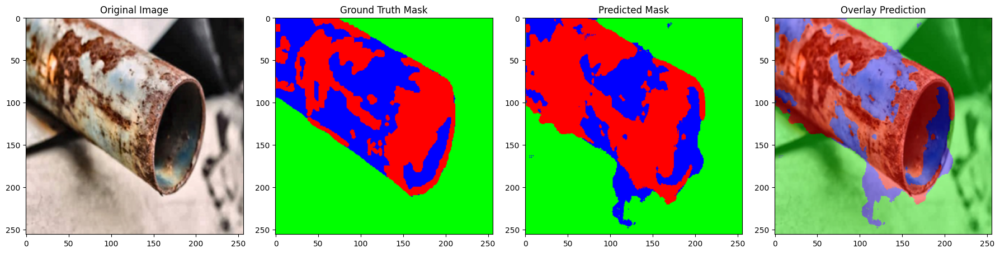

Image 1: Computation Time = 0.3634 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7563, IoU = 0.6081
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6328, IoU = 0.4628
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9561, IoU = 0.9159
--------------------------------------------------
Red Pixel Count (Corrosion): 20192
Blue Pixel Count (Pipe): 31036
Corrosion Percentage on Pipe: 65.06%


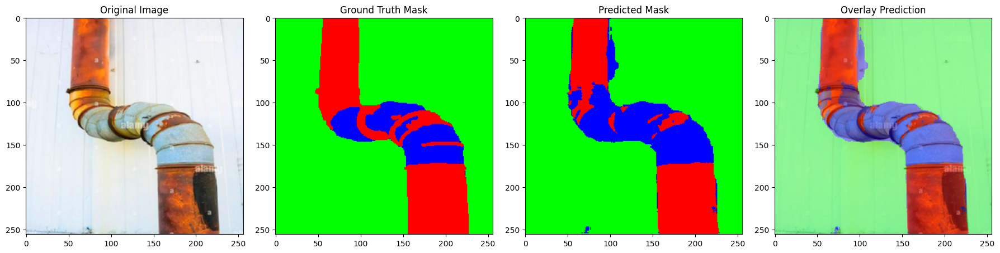

Image 2: Computation Time = 0.3415 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8783, IoU = 0.7830
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7573, IoU = 0.6094
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9904, IoU = 0.9809
--------------------------------------------------
Red Pixel Count (Corrosion): 10352
Blue Pixel Count (Pipe): 18831
Corrosion Percentage on Pipe: 54.97%


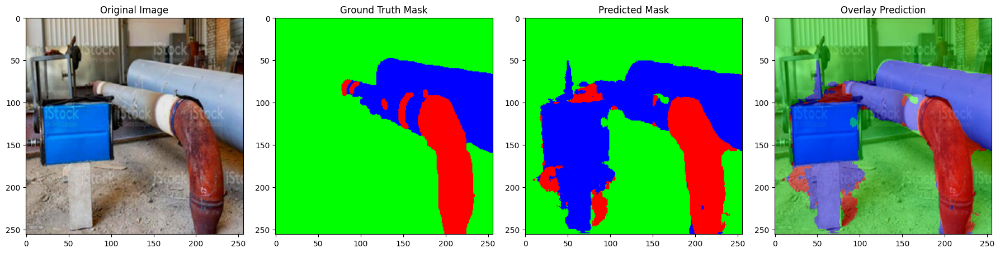

Image 3: Computation Time = 0.3419 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8127, IoU = 0.6845
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6116, IoU = 0.4405
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8528, IoU = 0.7433
--------------------------------------------------
Red Pixel Count (Corrosion): 8978
Blue Pixel Count (Pipe): 28283
Corrosion Percentage on Pipe: 31.74%


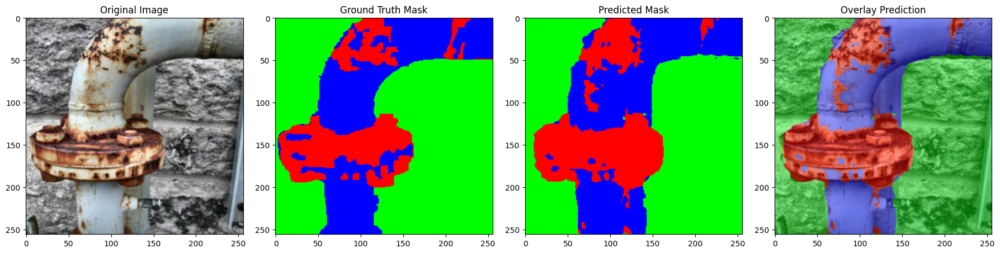

Image 4: Computation Time = 0.3715 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8175, IoU = 0.6914
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7996, IoU = 0.6661
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9435, IoU = 0.8930
--------------------------------------------------
Red Pixel Count (Corrosion): 13379
Blue Pixel Count (Pipe): 30995
Corrosion Percentage on Pipe: 43.17%


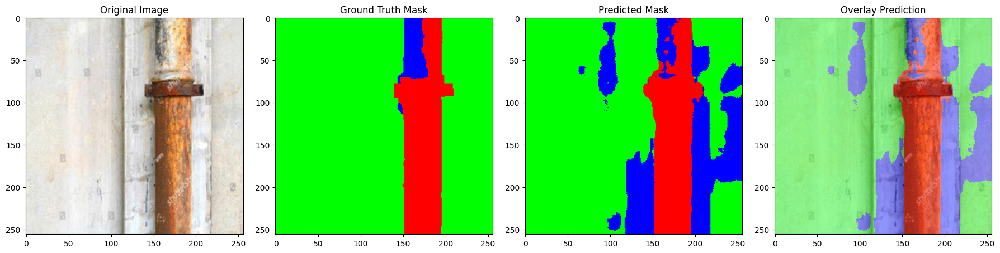

Image 5: Computation Time = 0.3665 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.9617, IoU = 0.9262
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.1442, IoU = 0.0777
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8666, IoU = 0.7646
--------------------------------------------------
Red Pixel Count (Corrosion): 10414
Blue Pixel Count (Pipe): 23908
Corrosion Percentage on Pipe: 43.56%


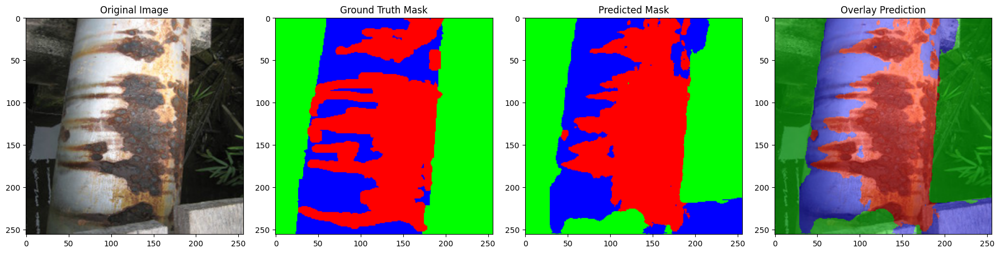

Image 6: Computation Time = 0.3349 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8282, IoU = 0.7067
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6512, IoU = 0.4827
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8759, IoU = 0.7792
--------------------------------------------------
Red Pixel Count (Corrosion): 22060
Blue Pixel Count (Pipe): 38772
Corrosion Percentage on Pipe: 56.90%


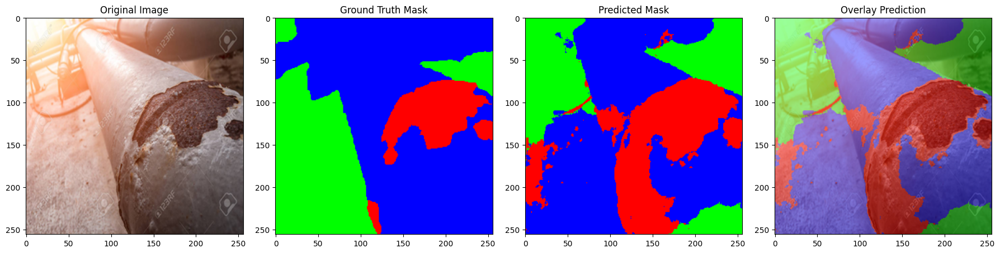

Image 7: Computation Time = 0.3837 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.6031, IoU = 0.4318
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.5939, IoU = 0.4224
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.3559, IoU = 0.2165
--------------------------------------------------
Red Pixel Count (Corrosion): 16598
Blue Pixel Count (Pipe): 49599
Corrosion Percentage on Pipe: 33.46%


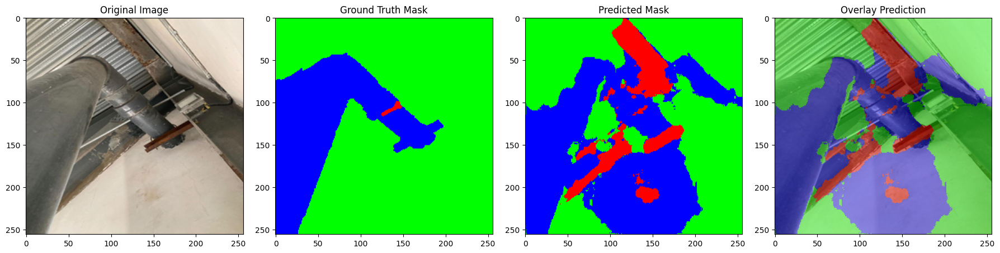

Image 8: Computation Time = 0.4218 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0200, IoU = 0.0101
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.5765, IoU = 0.4049
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.7161, IoU = 0.5578
--------------------------------------------------
Red Pixel Count (Corrosion): 6249
Blue Pixel Count (Pipe): 33574
Corrosion Percentage on Pipe: 18.61%


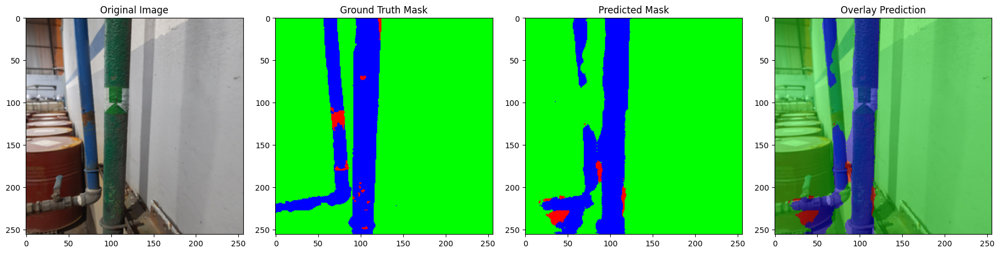

Image 9: Computation Time = 0.8711 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0429, IoU = 0.0219
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8492, IoU = 0.7379
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9653, IoU = 0.9330
--------------------------------------------------
Red Pixel Count (Corrosion): 592
Blue Pixel Count (Pipe): 11397
Corrosion Percentage on Pipe: 5.19%


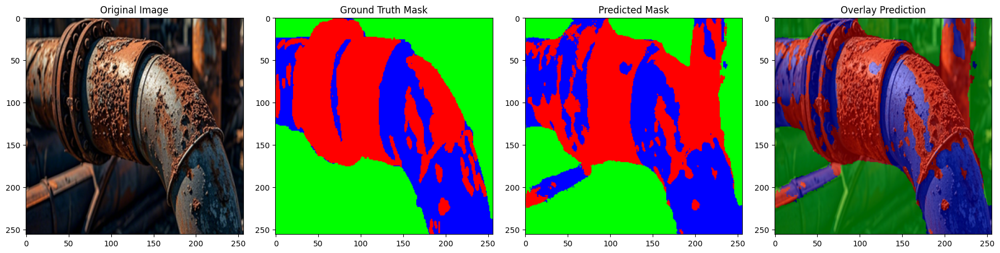

Image 10: Computation Time = 0.3781 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7422, IoU = 0.5901
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7177, IoU = 0.5597
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8793, IoU = 0.7847
--------------------------------------------------
Red Pixel Count (Corrosion): 22825
Blue Pixel Count (Pipe): 42505
Corrosion Percentage on Pipe: 53.70%


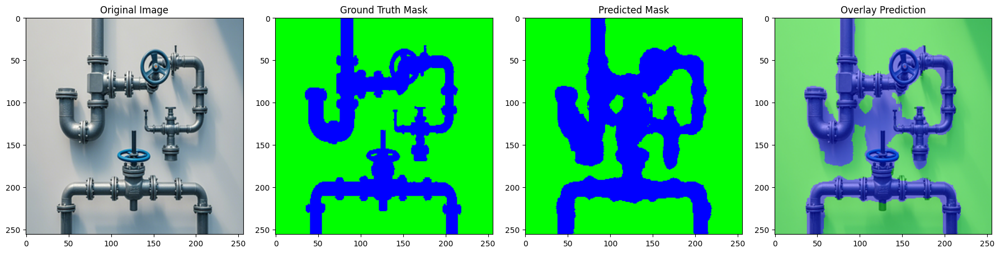

Image 11: Computation Time = 0.3580 seconds
Class 0 (Color: [255, 0, 0]): Dice = 1.0000, IoU = 1.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8278, IoU = 0.7062
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9336, IoU = 0.8755
--------------------------------------------------
Red Pixel Count (Corrosion): 0
Blue Pixel Count (Pipe): 20947
Corrosion Percentage on Pipe: 0.00%
Mean Evaluation Metrics (Across All Images):
Class 0 (Color: [255, 0, 0]): Mean Dice = 0.6785, Mean IoU = 0.5867
Class 1 (Color: [0, 0, 255]): Mean Dice = 0.6511, Mean IoU = 0.5064
Class 2 (Color: [0, 255, 0]): Mean Dice = 0.8487, Mean IoU = 0.7677
Average Computation Time per Image: 0.4120 seconds
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step


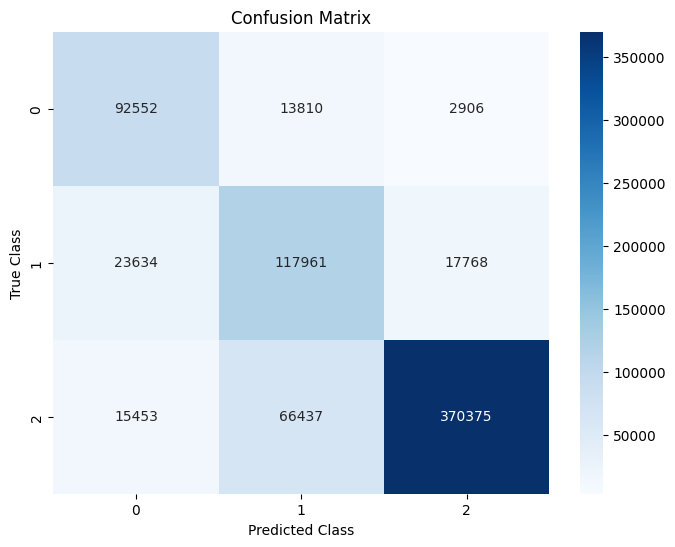

In [8]:
from sklearn.metrics import accuracy_score, confusion_matrix, jaccard_score
import seaborn as sns

# Visualisasi dengan Metriks Evaluasi
def dice_coefficient(y_true, y_pred):
    """Menghitung Dice Coefficient"""
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + 1e-7) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_score(y_true, y_pred):
    """Menghitung IoU Score"""
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + 1e-7) / (union + 1e-7)


def convert_to_rgb(mask, colormap):
    """Konversi mask kelas ke RGB menggunakan colormap"""
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(len(colormap)):
        rgb_mask[mask == cls] = colormap[cls]
    return rgb_mask

def overlay_images(original, mask, opacity=0.5):
    """Menggabungkan gambar asli dan mask dengan efek transparansi."""
    overlay = cv2.addWeighted(original, 1 - opacity, mask, opacity, 0)
    return overlay

def evaluate_model_on_val_data(model, X_val, y_val, colormap):
    """
    Mengevaluasi model pada data val dan menampilkan hasil prediksi dengan metrik evaluasi, overlay, dan waktu komputasi.
    
    Args:
        model: Model yang telah dilatih.
        X_val: Gambar input val.
        y_val: Ground truth mask val.
        colormap: Dictionary yang berisi peta warna untuk setiap kelas.
    """
    predictions = model.predict(X_val)
    predictions_class_index = np.argmax(predictions, axis=-1)
    y_val_class_index = np.argmax(y_val, axis=-1)

    num_classes = y_val.shape[-1]
    mean_dice = np.zeros(num_classes)
    mean_iou = np.zeros(num_classes)
    
    num_samples = X_val.shape[0]  # Total sample in the val set
    computation_times = []  # List to store computation times for each prediction
    
    # Tampilkan beberapa sampel hasil prediksi
    for i in range(num_samples):
        start_time = time.time()  # Start the timer for prediction
        
        plt.figure(figsize=(18, 6))
        
        # Gambar asli
        plt.subplot(1, 4, 1)
        plt.imshow(X_val[i])
        plt.title('Original Image')

        # Ground truth mask
        plt.subplot(1, 4, 2)
        ground_truth_rgb = convert_to_rgb(y_val_class_index[i], colormap)
        plt.imshow(ground_truth_rgb)
        plt.title('Ground Truth Mask')

        # Prediksi mask
        plt.subplot(1, 4, 3)
        predicted_rgb = convert_to_rgb(predictions_class_index[i], colormap)
        plt.imshow(predicted_rgb)
        plt.title('Predicted Mask')
        
        # Overlay gambar asli dengan prediksi
        overlay = overlay_images(X_val[i], predicted_rgb, opacity=0.4)  # Ubah opacity sesuai keinginan
        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title('Overlay Prediction')
        
        plt.tight_layout()
        plt.show()

        # Hitung waktu komputasi
        end_time = time.time()
        computation_time = end_time - start_time
        computation_times.append(computation_time)  # Append computation time
        print(f"Image {i+1}: Computation Time = {computation_time:.4f} seconds")
        
        # Hitung metrik untuk setiap kelas
        for cls in range(num_classes):
            y_true_class = (y_val_class_index[i] == cls).astype(np.uint8)
            y_pred_class = (predictions_class_index[i] == cls).astype(np.uint8)

            dice = dice_coefficient(y_true_class, y_pred_class)
            iou = iou_score(y_true_class, y_pred_class)

            mean_dice[cls] += dice
            mean_iou[cls] += iou

            print(f"Class {cls} (Color: {colormap[cls]}): Dice = {dice:.4f}, IoU = {iou:.4f}")
            print("--------------------------------------------------")

        # Hitung jumlah piksel warna merah dan biru serta persentase korosi
        red_pixel_count = np.sum((predicted_rgb == [255, 0, 0]).all(axis=-1))
        blue_pixel = np.sum((predicted_rgb == [0, 0, 255]).all(axis=-1))
        blue_pixel_count = red_pixel_count + blue_pixel
        corrosion_percentage = (red_pixel_count / blue_pixel_count) * 100 if blue_pixel_count > 0 else 0
    
        # Tampilkan hasil
        print(f"Red Pixel Count (Corrosion): {red_pixel_count}")
        print(f"Blue Pixel Count (Pipe): {blue_pixel_count}")
        print(f"Corrosion Percentage on Pipe: {corrosion_percentage:.2f}%")
        print("=======================================")           

    # Hitung rata-rata metrik
    mean_dice /= num_samples
    mean_iou /= num_samples

    print("Mean Evaluation Metrics (Across All Images):")
    for cls in range(num_classes):
        print(f"Class {cls} (Color: {colormap[cls]}): Mean Dice = {mean_dice[cls]:.4f}, Mean IoU = {mean_iou[cls]:.4f}")
    print("==================================================")
    
    # Hitung dan tampilkan rata-rata waktu komputasi
    avg_computation_time = np.mean(computation_times)
    print(f"Average Computation Time per Image: {avg_computation_time:.4f} seconds")

# Fungsi untuk menghitung Confusion Matrix
def calculate_confusion_matrix(y_true, y_pred):
    """Menghitung confusion matrix untuk setiap kelas."""
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    return cm

# Load data val
X_val_images, y_val_masks, y_val_one_hot_masks = load_and_one_hot_encode(val_original_dir, val_mask_dir, target_size)

# Konversi val data ke format yang sesuai untuk evaluasi
y_val_class_index = np.argmax(y_val_one_hot_masks, axis=-1)

# Evaluasi model pada data val
evaluate_model_on_val_data(model, X_val_images, y_val_one_hot_masks, colormap)

# Hitung confusion matrix
y_val_pred_class_index = np.argmax(model.predict(X_val_images), axis=-1)
cm = calculate_confusion_matrix(y_val_class_index, y_val_pred_class_index)

# Visualisasi confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

# Save Model

In [9]:
import pathlib
import tensorflow as tf
export_dir = 'model/256O_B8E100_MobileU-Net-EfficientNetB1'
tf.saved_model.save(model, export_dir)

INFO:tensorflow:Assets written to: model/256O_B8E100_MobileU-Net-EfficientNetB1\assets


INFO:tensorflow:Assets written to: model/256O_B8E100_MobileU-Net-EfficientNetB1\assets


In [10]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_model = converter.convert()

In [11]:
tflite_model_file = pathlib.Path('256O_B8E100_MobileU-Net-EfficientNetB1.tflite')
tflite_model_file.write_bytes(tflite_model)

464284

# Load Model & Predict Test

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


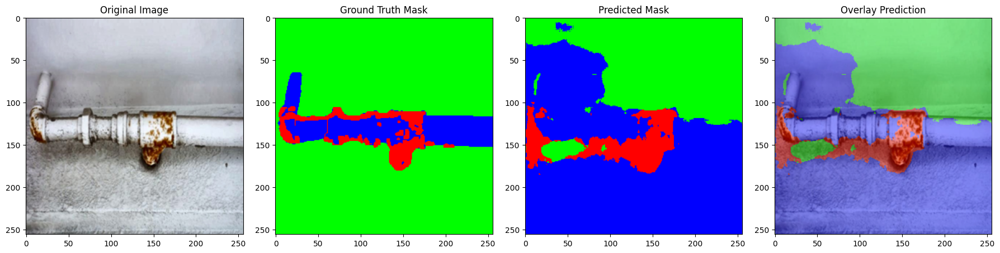

Image 1: Computation Time = 0.3328 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.5812, IoU = 0.4096
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.2707, IoU = 0.1565
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.5742, IoU = 0.4027
--------------------------------------------------
Red Pixel Count (Corrosion): 5352
Blue Pixel Count (Pipe): 42666
Corrosion Percentage on Pipe: 12.54%


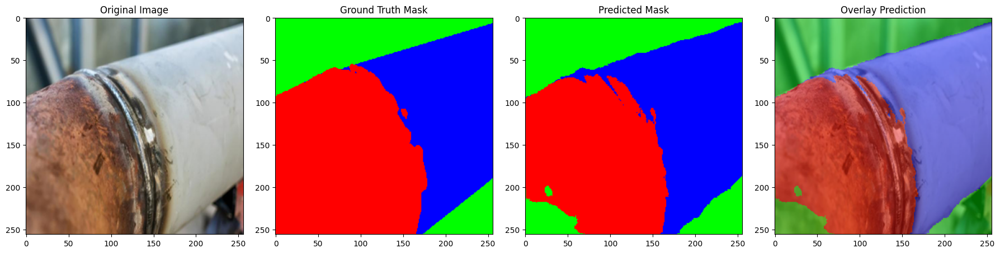

Image 2: Computation Time = 0.3419 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.9193, IoU = 0.8507
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.9406, IoU = 0.8878
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9195, IoU = 0.8510
--------------------------------------------------
Red Pixel Count (Corrosion): 25556
Blue Pixel Count (Pipe): 48962
Corrosion Percentage on Pipe: 52.20%


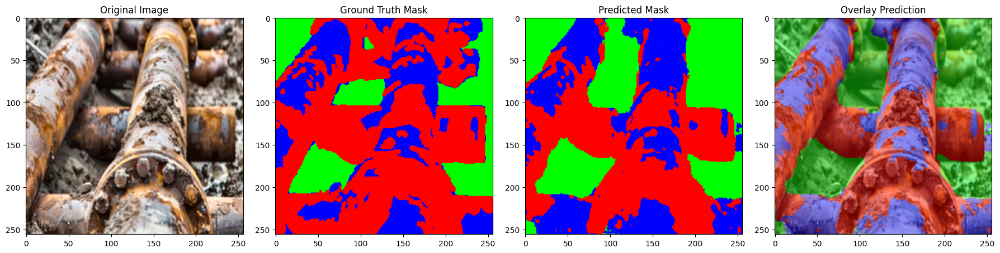

Image 3: Computation Time = 0.3340 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7592, IoU = 0.6119
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6978, IoU = 0.5359
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.7132, IoU = 0.5543
--------------------------------------------------
Red Pixel Count (Corrosion): 26230
Blue Pixel Count (Pipe): 44408
Corrosion Percentage on Pipe: 59.07%


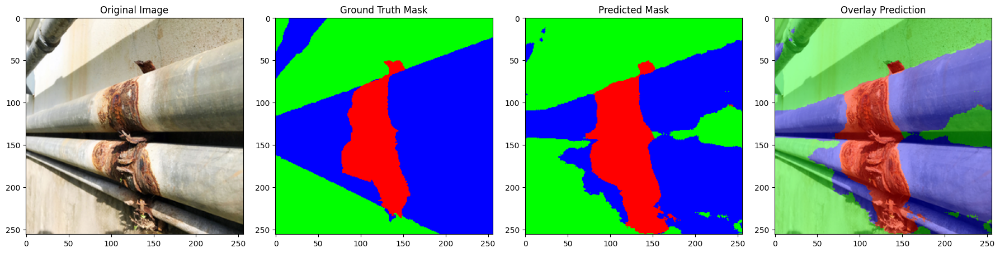

Image 4: Computation Time = 0.3758 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8522, IoU = 0.7425
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8480, IoU = 0.7361
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8473, IoU = 0.7351
--------------------------------------------------
Red Pixel Count (Corrosion): 10208
Blue Pixel Count (Pipe): 35752
Corrosion Percentage on Pipe: 28.55%


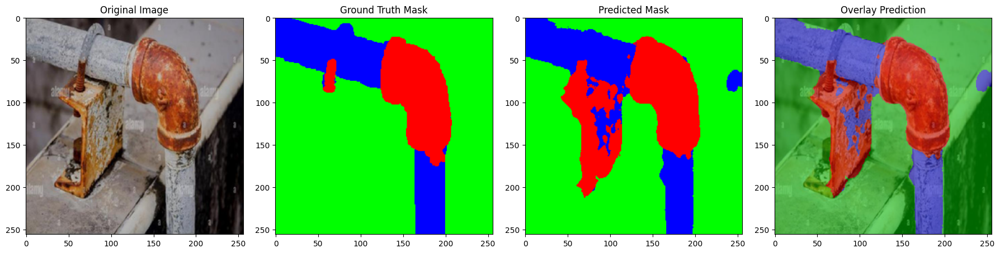

Image 5: Computation Time = 0.3357 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7459, IoU = 0.5947
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8640, IoU = 0.7605
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9138, IoU = 0.8413
--------------------------------------------------
Red Pixel Count (Corrosion): 13349
Blue Pixel Count (Pipe): 24497
Corrosion Percentage on Pipe: 54.49%


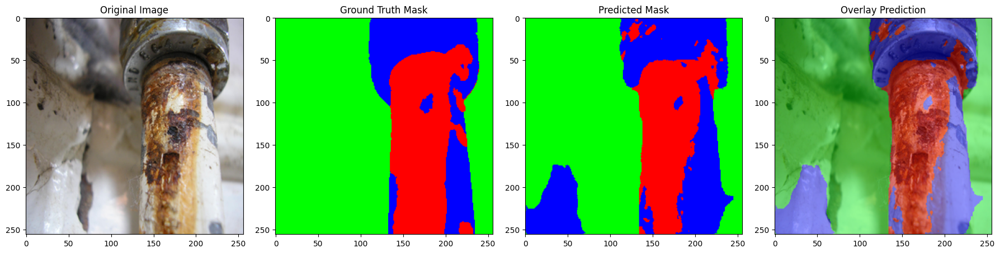

Image 6: Computation Time = 0.3365 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8323, IoU = 0.7128
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6889, IoU = 0.5254
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9350, IoU = 0.8780
--------------------------------------------------
Red Pixel Count (Corrosion): 12811
Blue Pixel Count (Pipe): 30137
Corrosion Percentage on Pipe: 42.51%


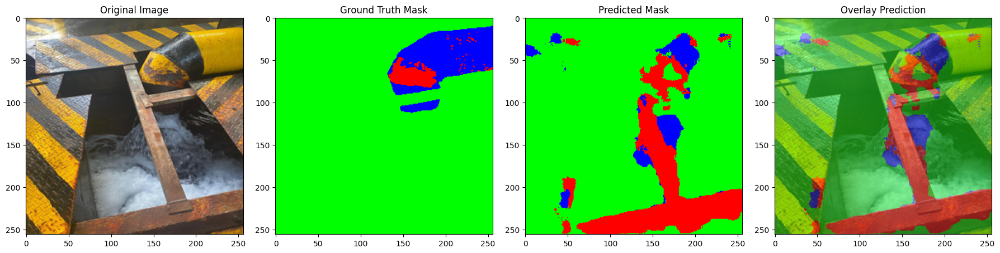

Image 7: Computation Time = 0.3538 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.1350, IoU = 0.0724
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.2576, IoU = 0.1479
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8595, IoU = 0.7537
--------------------------------------------------
Red Pixel Count (Corrosion): 10780
Blue Pixel Count (Pipe): 13775
Corrosion Percentage on Pipe: 78.26%


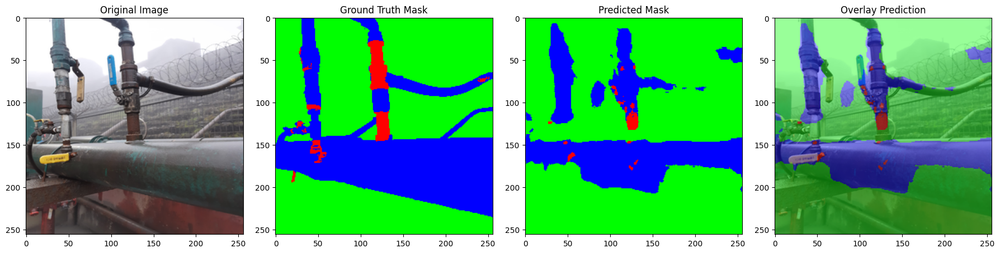

Image 8: Computation Time = 0.3491 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.2745, IoU = 0.1591
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6752, IoU = 0.5097
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8745, IoU = 0.7770
--------------------------------------------------
Red Pixel Count (Corrosion): 525
Blue Pixel Count (Pipe): 16383
Corrosion Percentage on Pipe: 3.20%


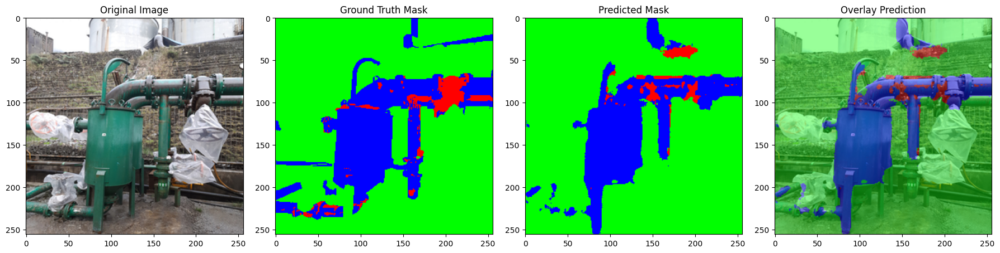

Image 9: Computation Time = 0.3327 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.1605, IoU = 0.0873
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7332, IoU = 0.5788
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9261, IoU = 0.8624
--------------------------------------------------
Red Pixel Count (Corrosion): 1418
Blue Pixel Count (Pipe): 14347
Corrosion Percentage on Pipe: 9.88%


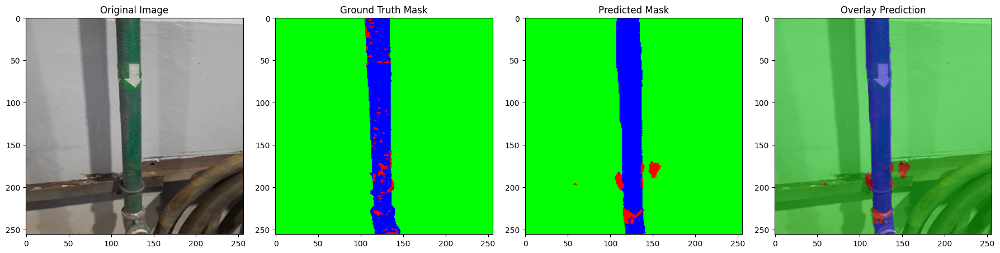

Image 10: Computation Time = 0.3335 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.1088, IoU = 0.0575
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.9070, IoU = 0.8298
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9926, IoU = 0.9852
--------------------------------------------------
Red Pixel Count (Corrosion): 603
Blue Pixel Count (Pipe): 6894
Corrosion Percentage on Pipe: 8.75%


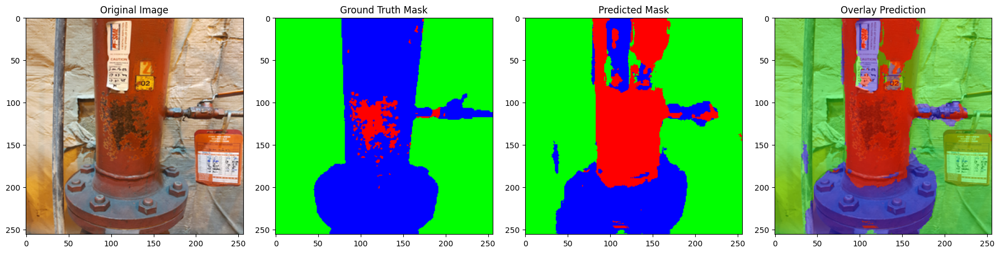

Image 11: Computation Time = 0.3391 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.2624, IoU = 0.1510
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6097, IoU = 0.4385
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9508, IoU = 0.9063
--------------------------------------------------
Red Pixel Count (Corrosion): 12966
Blue Pixel Count (Pipe): 26123
Corrosion Percentage on Pipe: 49.63%


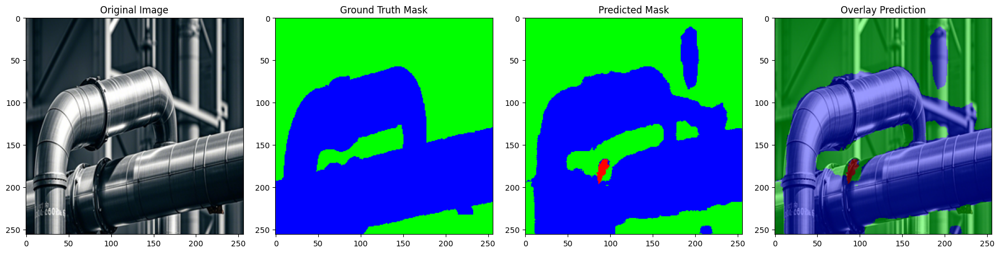

Image 12: Computation Time = 0.3804 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0000, IoU = 0.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.9105, IoU = 0.8357
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9039, IoU = 0.8247
--------------------------------------------------
Red Pixel Count (Corrosion): 229
Blue Pixel Count (Pipe): 35277
Corrosion Percentage on Pipe: 0.65%
Mean Evaluation Metrics (Across All Images):
Class 0 (Color: [255, 0, 0]): Mean Dice = 0.4693, Mean IoU = 0.3708
Class 1 (Color: [0, 0, 255]): Mean Dice = 0.7003, Mean IoU = 0.5786
Class 2 (Color: [0, 255, 0]): Mean Dice = 0.8675, Mean IoU = 0.7810
Average Computation Time per Image: 0.3454 seconds
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


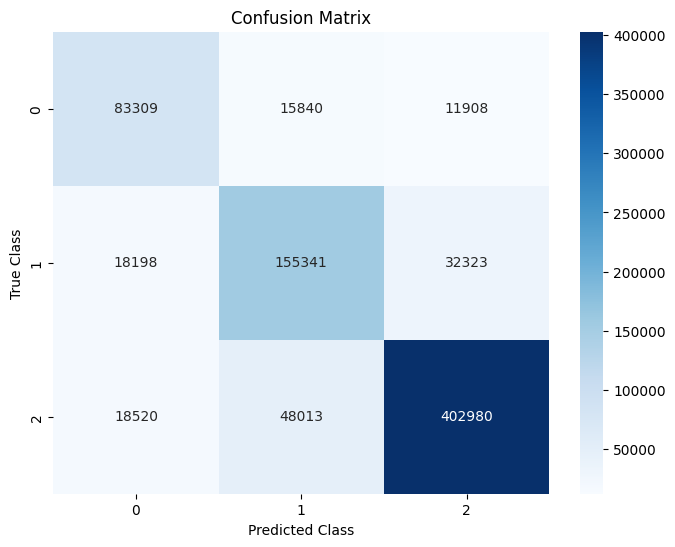

In [12]:
from keras.models import load_model
import re
from sklearn.metrics import accuracy_score, confusion_matrix, jaccard_score
import seaborn as sns

# Model
model_path = 'C:\\Users\\Admin\\Documents\\Model\\mUnet\\model\\256O_B8E100_MobileU-Net-EfficientNetB1.keras'
model = load_model(model_path)

# Visualisasi dengan Metriks Evaluasi
def dice_coefficient(y_true, y_pred):
    """Menghitung Dice Coefficient"""
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + 1e-7) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_score(y_true, y_pred):
    """Menghitung IoU Score"""
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + 1e-7) / (union + 1e-7)

def convert_to_rgb(mask, colormap):
    """Konversi mask kelas ke RGB menggunakan colormap"""
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(len(colormap)):
        rgb_mask[mask == cls] = colormap[cls]
    return rgb_mask

def overlay_images(original, mask, opacity=0.5):
    """Menggabungkan gambar asli dan mask dengan efek transparansi."""
    overlay = cv2.addWeighted(original, 1 - opacity, mask, opacity, 0)
    return overlay

def evaluate_model_on_test_data(model, X, y_test, colormap):
    """
    Mengevaluasi model pada data val dan menampilkan hasil prediksi dengan metrik evaluasi, overlay, dan waktu komputasi.
    
    Args:
        model: Model yang telah dilatih.
        X: Gambar input val.
        y_test: Ground truth mask val.
        colormap: Dictionary yang berisi peta warna untuk setiap kelas.
    """
    predictions = model.predict(X)
    predictions_class_index = np.argmax(predictions, axis=-1)
    y_test_class_index = np.argmax(y_test, axis=-1)

    num_classes = y_test.shape[-1]
    mean_dice = np.zeros(num_classes)
    mean_iou = np.zeros(num_classes)
    
    num_samples = X.shape[0]  # Total sample in the val set
    computation_times = []  # List to store computation times for each prediction
    
    # Tampilkan beberapa sampel hasil prediksi
    for i in range(num_samples):
        start_time = time.time()  # Start the timer for prediction
        
        plt.figure(figsize=(18, 6))
        
        # Gambar asli
        plt.subplot(1, 4, 1)
        plt.imshow(X[i])
        plt.title('Original Image')

        # Ground truth mask
        plt.subplot(1, 4, 2)
        ground_truth_rgb = convert_to_rgb(y_test_class_index[i], colormap)
        plt.imshow(ground_truth_rgb)
        plt.title('Ground Truth Mask')

        # Prediksi mask
        plt.subplot(1, 4, 3)
        predicted_rgb = convert_to_rgb(predictions_class_index[i], colormap)
        plt.imshow(predicted_rgb)
        plt.title('Predicted Mask')
        
        # Overlay gambar asli dengan prediksi
        overlay = overlay_images(X[i], predicted_rgb, opacity=0.4)  # Ubah opacity sesuai keinginan
        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title('Overlay Prediction')
        
        plt.tight_layout()
        plt.show()

        # Hitung waktu komputasi
        end_time = time.time()
        computation_time = end_time - start_time
        computation_times.append(computation_time)  # Append computation time
        print(f"Image {i+1}: Computation Time = {computation_time:.4f} seconds")
        
        # Hitung metrik untuk setiap kelas
        for cls in range(num_classes):
            y_true_class = (y_test_class_index[i] == cls).astype(np.uint8)
            y_pred_class = (predictions_class_index[i] == cls).astype(np.uint8)

            dice = dice_coefficient(y_true_class, y_pred_class)
            iou = iou_score(y_true_class, y_pred_class)

            mean_dice[cls] += dice
            mean_iou[cls] += iou

            print(f"Class {cls} (Color: {colormap[cls]}): Dice = {dice:.4f}, IoU = {iou:.4f}")
            print("--------------------------------------------------")

        # Hitung jumlah piksel warna merah dan biru serta persentase korosi
        red_pixel_count = np.sum((predicted_rgb == [255, 0, 0]).all(axis=-1))
        blue_pixel = np.sum((predicted_rgb == [0, 0, 255]).all(axis=-1))
        blue_pixel_count = red_pixel_count + blue_pixel
        corrosion_percentage = (red_pixel_count / blue_pixel_count) * 100 if blue_pixel_count > 0 else 0
    
        # Tampilkan hasil
        print(f"Red Pixel Count (Corrosion): {red_pixel_count}")
        print(f"Blue Pixel Count (Pipe): {blue_pixel_count}")
        print(f"Corrosion Percentage on Pipe: {corrosion_percentage:.2f}%")
        print("=======================================")         

    # Hitung rata-rata metrik
    mean_dice /= num_samples
    mean_iou /= num_samples

    print("Mean Evaluation Metrics (Across All Images):")
    for cls in range(num_classes):
        print(f"Class {cls} (Color: {colormap[cls]}): Mean Dice = {mean_dice[cls]:.4f}, Mean IoU = {mean_iou[cls]:.4f}")
    print("==================================================")
    
    # Hitung dan tampilkan rata-rata waktu komputasi
    avg_computation_time = np.mean(computation_times)
    print(f"Average Computation Time per Image: {avg_computation_time:.4f} seconds")

# Fungsi untuk menghitung Confusion Matrix
def calculate_confusion_matrix(y_true, y_pred):
    """Menghitung confusion matrix untuk setiap kelas."""
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    return cm

# Load data val
X_test_images, y_test_masks, y_test_one_hot_masks = load_and_one_hot_encode(test_original_dir, test_mask_dir, target_size)

# Konversi test data ke format yang sesuai untuk evaluasi
y_test_class_index = np.argmax(y_test_one_hot_masks, axis=-1)

# Evaluasi model pada data val
evaluate_model_on_test_data(model, X_test_images, y_test_one_hot_masks, colormap)

# Hitung confusion matrix
y_test_pred_class_index = np.argmax(model.predict(X_test_images), axis=-1)
cm = calculate_confusion_matrix(y_test_class_index, y_test_pred_class_index)

# Visualisasi confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

In [ ]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to calculate IoU and Dice Coefficient
def calculate_metrics(y_true, y_pred, num_classes=3):
    """Calculate IoU and Dice Coefficient for each class."""
    results = []
    
    for class_idx in range(num_classes):
        intersection = np.logical_and(y_true == class_idx, y_pred == class_idx).sum()
        union = np.logical_or(y_true == class_idx, y_pred == class_idx).sum()
        dice_numerator = 2 * intersection
        dice_denominator = (y_true == class_idx).sum() + (y_pred == class_idx).sum()
        
        iou = intersection / union if union != 0 else 0.0
        dice = dice_numerator / dice_denominator if dice_denominator != 0 else 0.0
        
        results.append({
            "Class": class_idx,
            "Intersection": intersection,
            "Union": union,
            "IoU": iou,
            "Dice Numerator": dice_numerator,
            "Dice Denominator": dice_denominator,
            "Dice Coefficient": dice
        })
    
    return pd.DataFrame(results)

# Evaluate model on test images
y_test_pred_class_index = np.argmax(model.predict(X_test_images), axis=-1)

# Calculate metrics for each image
all_metrics = []
for i in range(len(X_test_images)):
    metrics_df = calculate_metrics(y_test_class_index[i], y_test_pred_class_index[i])
    metrics_df.insert(0, "Image Index", i+1)  # Add image index
    all_metrics.append(metrics_df)
    
    # Display each image's metrics in table format
    print(f"Metrics for Image {i+1}")
    print(metrics_df)
    print("-" * 50)

# Combine all results into a single DataFrame
total_metrics_df = pd.concat(all_metrics, ignore_index=True)

# Visualizing metrics
g = sns.catplot(data=total_metrics_df, x="Class", y="IoU", hue="Image Index", kind="bar", height=5, aspect=2)
g.set_axis_labels("Class", "IoU Score")
plt.title("IoU Scores for Each Class and Image")
plt.show()

g = sns.catplot(data=total_metrics_df, x="Class", y="Dice Coefficient", hue="Image Index", kind="bar", height=5, aspect=2)
g.set_axis_labels("Class", "Dice Coefficient Score")
plt.title("Dice Coefficient Scores for Each Class and Image")
plt.show()